# **Analyzing Chronic Health Conditions, Substance Abuse, and Healthcare Access in Stockport, UK using Spatial Data Science**

In [1]:
# import required packages
import pandas as pd
import numpy as np
# packages for visulising data
import matplotlib.pyplot as plt
import seaborn as sns


**Sources**


First Dataset: Stockport Hospital Attendances and Admissions https://datamillnorth.org/dataset/ep6pr/stockport-hospital-attendances-and-admissions



Second Dataset: Stockport Smoking and Asthma Prevalence https://datamillnorth.org/dataset/2jq60/stockport-smoking-and-asthma-prevalence



Third dataset: Stockport Local Health Characteristics https://datamillnorth.org/dataset/20j06/stockport-local-health-characteristics



UK LSOA Shapefile: 2011 Census Geography boundaries (Lower Layer Super Output Areas and Data Zones) https://statistics.ukdataservice.ac.uk/dataset/2011-census-geography-boundaries-lower-layer-super-output-areas-and-data-zones

**1. FIRST DATASET**

In [2]:
# load the first dataset
hospital_alcohol = pd.read_csv("Hospital_Attendances_and_Admissions.csv")

**1.1.** **DATA** **SUMMARY**

In [3]:
# look at the number of rows and columns
hospital_alcohol.shape

(190, 22)

In [4]:
# look at the names of all the columns
hospital_alcohol.columns

Index(['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'AllED', 'MaleED',
       'FemaleED', 'AllEDSig', 'MaleEDSig', 'FemEDSig', 'AllEmAdm',
       'MaleEmAdm', 'FemEmAdm', 'AllEmSig', 'MaleEmSig', 'FemEmSig',
       'AllAlcAdm', 'MalAlcAdm', 'FemAlcAdm', 'AlcAdmSig', 'MaleAlcSi',
       'FemAlcSig'],
      dtype='object')

In [5]:
# look at the first 15 rows of the dataframe
hospital_alcohol.head(15)

,ogc_fid,lsoa11cd,lsoa11nm,lsoa11nmw,AllED,MaleED,FemaleED,AllEDSig,MaleEDSig,FemEDSig,...,FemEmAdm,AllEmSig,MaleEmSig,FemEmSig,AllAlcAdm,MalAlcAdm,FemAlcAdm,AlcAdmSig,MaleAlcSi,FemAlcSig
0,5601,E01005761,Stockport 026A,Stockport 026A,36633.9,"35,809.90","37,303.40",Higher,Higher,Higher,...,18462.29536,Higher,Higher but not significantly so,Higher,"2,811.60","3,644.60","1,924.10",Higher but not significantly so,Higher but not significantly so,Higher but not significantly so
1,5710,E01005870,Stockport 015A,Stockport 015A,35895.4,"35,716.30","36,761.20",Higher,Higher,Higher,...,17664.11422,Higher,Higher but not significantly so,Higher,"2,421.00","3,376.70","1,591.40",Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
2,5711,E01005871,Stockport 015B,Stockport 015B,33627.0,"32,878.10","34,513.20",Higher but not significantly so,Higher but not significantly so,Higher but not significantly so,...,15815.48054,Higher but not significantly so,Higher but not significantly so,Higher but not significantly so,"2,528.30","3,016.00","2,159.80",Higher but not significantly so,Lower but not significantly so,Higher but not significantly so
3,5583,E01005743,Stockport 009A,Stockport 009A,28705.8,"28,998.40","28,230.30",Lower,Lower,Lower,...,11582.04023,Lower,Lower but not significantly so,Lower,"2,112.30","2,805.50","1,453.80",Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
4,5584,E01005744,Stockport 009B,Stockport 009B,44001.3,"43,025.20","45,920.70",Higher,Higher,Higher,...,21533.59309,Higher,Higher,Higher,"4,150.70","6,191.80","2,193.00",Higher,Higher,Higher but not significantly so
5,5585,E01005745,Stockport 005A,Stockport 005A,30189.8,"28,683.10","32,886.50",Lower,Lower,Higher but not significantly so,...,15683.47737,Lower but not significantly so,Lower,Higher but not significantly so,"1,886.50","2,470.50","1,289.20",Lower,Lower,Lower but not significantly so
6,5586,E01005746,Stockport 005B,Stockport 005B,43055.3,"39,654.20","47,407.00",Higher,Higher,Higher,...,22913.63951,Higher,Higher,Higher,"4,324.60","4,885.90","3,841.30",Higher,Higher,Higher
7,5587,E01005747,Stockport 005C,Stockport 005C,26804.0,"28,369.30","25,608.30",Lower,Lower,Lower,...,10396.31448,Lower,Lower,Lower,"1,868.60","2,691.60","1,134.70",Lower,Lower but not significantly so,Lower
8,5588,E01005748,Stockport 005D,Stockport 005D,25441.8,"24,812.50","25,903.70",Lower,Lower,Lower,...,10147.54126,Lower,Lower,Lower,"2,290.50","3,083.70","1,486.50",Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
9,5589,E01005749,Stockport 009C,Stockport 009C,30467.1,"28,771.80","32,283.10",Lower,Lower,Higher but not significantly so,...,13673.90530,Lower but not significantly so,Lower but not significantly so,Lower but not significantly so,"2,255.00","2,735.00","1,844.70",Lower but not significantly so,Lower but not significantly so,Higher but not significantly so


In [6]:
# look at the last 15 rows of the dataframe
hospital_alcohol.tail(15)

,ogc_fid,lsoa11cd,lsoa11nm,lsoa11nmw,AllED,MaleED,FemaleED,AllEDSig,MaleEDSig,FemEDSig,...,FemEmAdm,AllEmSig,MaleEmSig,FemEmSig,AllAlcAdm,MalAlcAdm,FemAlcAdm,AlcAdmSig,MaleAlcSi,FemAlcSig
175,5758,E01005918,Stockport 014D,Stockport 014D,62913.7,"65,603.40","60,669.20",Higher,Higher,Higher,...,28907.235960,Higher,Higher,Higher,"7,994.80","10,854.10","4,518.60",Higher,Higher,Higher
176,5759,E01005919,Stockport 002E,Stockport 002E,46156.7,"49,837.60","44,794.40",Higher,Higher,Higher,...,21804.499310,Higher,Higher,Higher,"3,948.50","6,185.50","2,567.90",Higher,Higher,Higher
177,5760,E01005920,Stockport 003D,Stockport 003D,25965.5,"26,777.20","25,244.70",Lower,Lower,Lower,...,10595.948890,Lower,Lower,Lower,"2,214.70","2,907.90","1,648.90",Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
178,5761,E01005921,Stockport 003E,Stockport 003E,35626.5,"35,006.00","36,490.60",Higher,Higher but not significantly so,Higher,...,16275.737060,Higher,Higher but not significantly so,Higher,"2,785.00","3,212.00","2,477.90",Higher but not significantly so,Lower but not significantly so,Higher
179,5762,E01005922,Stockport 003F,Stockport 003F,30705.7,"34,081.80","27,694.70",Lower but not significantly so,Higher but not significantly so,Lower,...,12051.524850,Lower but not significantly so,Higher but not significantly so,Lower,"2,598.50","3,898.60","1,520.40",Higher but not significantly so,Higher but not significantly so,Lower but not significantly so
180,5763,E01005923,Stockport 041C,Stockport 041C,22565.6,"23,143.90","21,942.10",Lower,Lower,Lower,...,8982.354252,Lower,Lower,Lower,"1,579.20","1,771.70","1,431.60",Lower,Lower,Lower but not significantly so
181,5764,E01005924,Stockport 042A,Stockport 042A,22702.5,"22,993.40","22,411.80",Lower,Lower,Lower,...,9845.230233,Lower,Lower,Lower,"1,268.10","1,545.80","1,059.00",Lower,Lower,Lower
182,5765,E01005925,Stockport 042B,Stockport 042B,22904.8,"22,712.70","23,170.80",Lower,Lower,Lower,...,10321.969480,Lower,Lower,Lower,"1,589.20","2,389.40",966.1,Lower,Lower,Lower
183,5766,E01005926,Stockport 042C,Stockport 042C,30754.4,"34,950.30","26,120.10",Lower but not significantly so,Higher but not significantly so,Lower,...,12668.400030,Lower,Lower,Lower but not significantly so,"2,047.40","2,715.10","1,264.30",Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
184,5767,E01005927,Stockport 032A,Stockport 032A,22930.6,"23,157.70","23,060.20",Lower,Lower,Lower,...,9226.727376,Lower,Lower,Lower,"1,450.50","2,210.20",771.1,Lower,Lower,Lower


The columns containing data on the number of individuals exhibit decimal points due to the application of age standardization. The provided data represents the direct age-standardized rate per 100,000 for all individuals, as well as separately for males and females (Stockport Metropolitan Borough Council). Calculating summary health statistics that remove the effects of age structure variation is advantageous for comparing age-specific epidemiological and demographic rates across populations with differing age compositions (Ahmad et al., 2001).

**1.2. DATA PREPROCESSING**

1.2.1. Changing the variable names for consistency

We observed that the names of the columns are not consistent; some initials are in capitals. These should be changed to maintain consistency and readability according to naming conventions in coding (Weichun, 2023).

In [7]:
cols1 = ['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'all_emerg_dep_attend', 'm_emerg_dep_attend','f_emerg_dep_attend', 'all_emerg_dep_attend_signi', 'm_emerg_dep_attend_signi', 'f_emerg_dep_attend_signi', 'all_emerg_dep_admin','m_emerg_dep_admin', 'f_emerg_dep_admin', 'all_emerg_dep_admin_signi', 'm_emerg_dep_admin_signi', 'f_emerg_Dep_admin_signi','all_alco_admin', 'm_alco_admin', 'f_alco_admin', 'all_alco_admin_signi', 'm_alco_admin_signi','f_alco_admin_signi']
hospital_alcohol = pd.read_csv("Hospital_Attendances_and_Admissions.csv", header=None, skiprows=1, names=cols1)

 1.2.2. Checking data types and null values

In [8]:
# look at a concise summary and structure of the dataframe
hospital_alcohol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ogc_fid                     190 non-null    int64  
 1   lsoa11cd                    190 non-null    object 
 2   lsoa11nm                    190 non-null    object 
 3   lsoa11nmw                   190 non-null    object 
 4   all_emerg_dep_attend        190 non-null    float64
 5   m_emerg_dep_attend          190 non-null    object 
 6   f_emerg_dep_attend          190 non-null    object 
 7   all_emerg_dep_attend_signi  190 non-null    object 
 8   m_emerg_dep_attend_signi    190 non-null    object 
 9   f_emerg_dep_attend_signi    190 non-null    object 
 10  all_emerg_dep_admin         190 non-null    float64
 11  m_emerg_dep_admin           190 non-null    float64
 12  f_emerg_dep_admin           190 non-null    float64
 13  all_emerg_dep_admin_signi   190 non

In [9]:
# it is visible that some columns do not have suitable data types
# for example, "m_emerg_dep_admin" reflects the number of males who were admitted in the emergency department and hence should be a 'float64' data type
# the reason for this can be that some of the numerical columns contains ',' as we saw in the 1. DATA SUMMARY part using .head() and .tail() functions of the pandas package

# remove the commas and change the variables to a suitable format
columns_to_convert = ['m_emerg_dep_attend', 'f_emerg_dep_attend', 'all_emerg_dep_admin', 'm_emerg_dep_admin', 'f_emerg_dep_admin', 'all_alco_admin', 'm_alco_admin', 'f_alco_admin']
hospital_alcohol[columns_to_convert] = hospital_alcohol[columns_to_convert].replace(',', '', regex=True).astype(float)

In [10]:
# look at the updated data types
hospital_alcohol.dtypes


ogc_fid                         int64
lsoa11cd                       object
lsoa11nm                       object
lsoa11nmw                      object
all_emerg_dep_attend          float64
m_emerg_dep_attend            float64
f_emerg_dep_attend            float64
all_emerg_dep_attend_signi     object
m_emerg_dep_attend_signi       object
f_emerg_dep_attend_signi       object
all_emerg_dep_admin           float64
m_emerg_dep_admin             float64
f_emerg_dep_admin             float64
all_emerg_dep_admin_signi      object
m_emerg_dep_admin_signi        object
f_emerg_Dep_admin_signi        object
all_alco_admin                float64
m_alco_admin                  float64
f_alco_admin                  float64
all_alco_admin_signi           object
m_alco_admin_signi             object
f_alco_admin_signi             object
dtype: object

In [11]:
# all the variables belong to suitable data types

In [12]:
# look and count the number of null values
# although, it was observed using .info() before, we will still use it to make sure if any null values are present in the dataset or not
hospital_alcohol.isnull().sum()

ogc_fid                       0
lsoa11cd                      0
lsoa11nm                      0
lsoa11nmw                     0
all_emerg_dep_attend          0
m_emerg_dep_attend            0
f_emerg_dep_attend            0
all_emerg_dep_attend_signi    0
m_emerg_dep_attend_signi      0
f_emerg_dep_attend_signi      0
all_emerg_dep_admin           0
m_emerg_dep_admin             0
f_emerg_dep_admin             0
all_emerg_dep_admin_signi     0
m_emerg_dep_admin_signi       0
f_emerg_Dep_admin_signi       0
all_alco_admin                0
m_alco_admin                  0
f_alco_admin                  0
all_alco_admin_signi          0
m_alco_admin_signi            0
f_alco_admin_signi            0
dtype: int64

In [13]:
# look at the unique values in some of the categorical data columns to understand the distribution of data
hospital_alcohol["all_emerg_dep_admin_signi"].unique()

array(['Higher', 'Higher but not significantly so', 'Lower',
       'Lower but not significantly so'], dtype=object)

In [14]:
hospital_alcohol["all_alco_admin_signi"].unique()

array(['Higher but not significantly so',
       'Lower but not significantly so', 'Higher', 'Lower'], dtype=object)

In [15]:
# look at descriptive statistics
# before moving to data exploration part, descriptive statistics should be checked as it will help us with summarising the statistics for further analysis.
hospital_alcohol.describe()

,ogc_fid,all_emerg_dep_attend,m_emerg_dep_attend,f_emerg_dep_attend,all_emerg_dep_admin,m_emerg_dep_admin,f_emerg_dep_admin,all_alco_admin,m_alco_admin,f_alco_admin
count,190.000000,190.000000,190.000000,190.000000,190.000000,190.000000,190.000000,190.000000,190.000000,190.000000
mean,5677.500000,32159.356316,32911.370000,31661.137368,13552.895804,12977.556908,14359.326985,2534.249474,3477.514211,1725.983684
std,54.992424,7598.720235,7895.708038,7865.690139,4049.142488,4015.182243,4477.134788,1093.531091,1432.057530,873.266745
min,5583.000000,19544.500000,19370.100000,18783.200000,7470.430107,6780.941640,7731.121804,1118.700000,1316.700000,544.100000
25%,5630.250000,26871.325000,27331.775000,26003.775000,10477.540377,9982.098024,10577.128188,1771.725000,2477.825000,1111.250000
50%,5677.500000,30835.050000,31658.250000,30614.600000,12764.527745,12317.768155,13688.024165,2239.600000,3105.400000,1496.850000
75%,5724.750000,36199.900000,37416.500000,36538.225000,15407.104275,14626.831592,16682.434050,2938.950000,4036.425000,2134.800000
max,5772.000000,62913.700000,65603.400000,62729.200000,29179.937880,29832.207350,30876.935900,7994.800000,10854.100000,5331.800000


**1.3 DATA EXPLORATION**

In [16]:
# explore and visualise the dataset
# gather relevant insights to use it further in the project

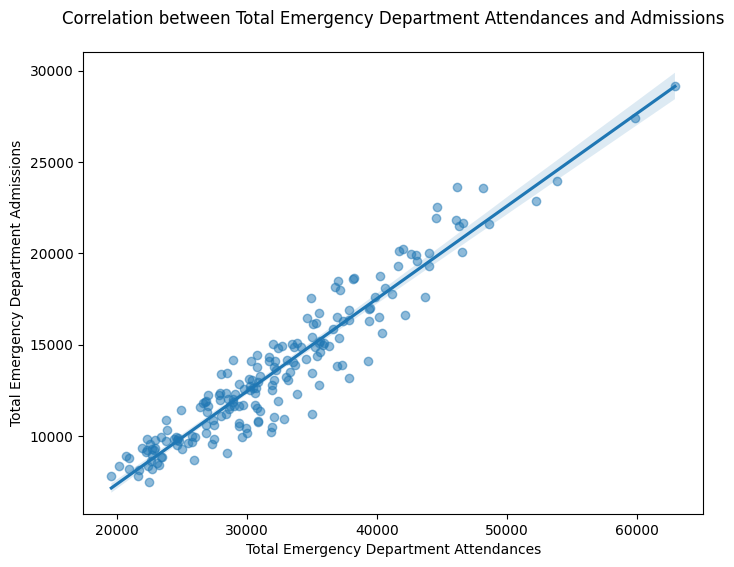

In [17]:
# look at the correlation between number of attendees and number of admissions in the emergency department
# create a scatter plot with regression line # 'use pad=20' to give space between the title and plot
plt.figure(figsize=(8, 6))
sns.regplot(x='all_emerg_dep_attend', y='all_emerg_dep_admin', data=hospital_alcohol, scatter_kws={'alpha':0.5})
plt.title('Correlation between Total Emergency Department Attendances and Admissions', pad=20)
plt.xlabel('Total Emergency Department Attendances',)
plt.ylabel('Total Emergency Department Admissions')
plt.show()


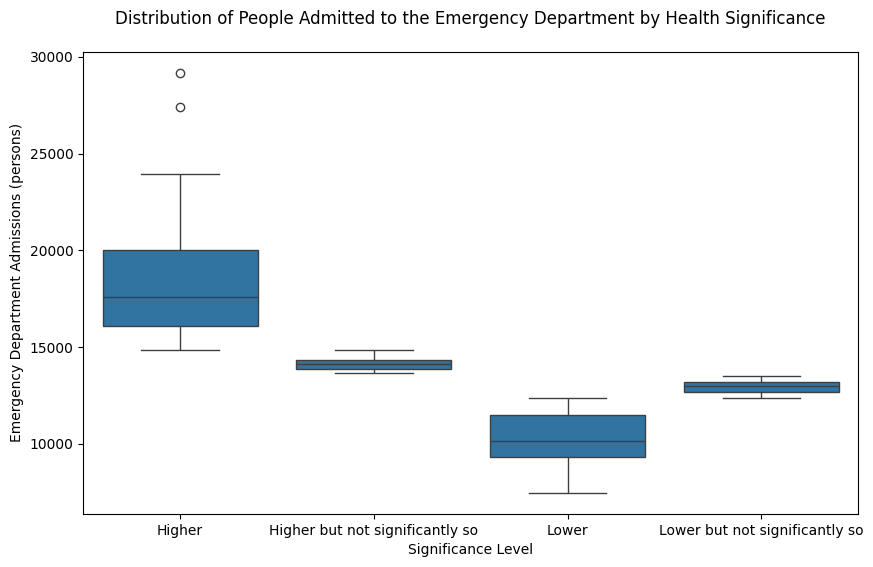

In [18]:
# look at the distribution of people admitted to the emergency department with significance of health condition
# box plot will be appropriate to visualise bivariate data with one numerical and categorical data (Pandey and Dhoundiyalb, 2015).

# create a box plot
# use 'pad=20' to give some space between the title and the chart
plt.figure(figsize=(10, 6))
sns.boxplot(x='all_emerg_dep_admin_signi', y='all_emerg_dep_admin', data=hospital_alcohol)
plt.title('Distribution of People Admitted to the Emergency Department by Health Significance', pad=20)
plt.xlabel('Significance Level')
plt.ylabel('Emergency Department Admissions (persons)')
plt.show()

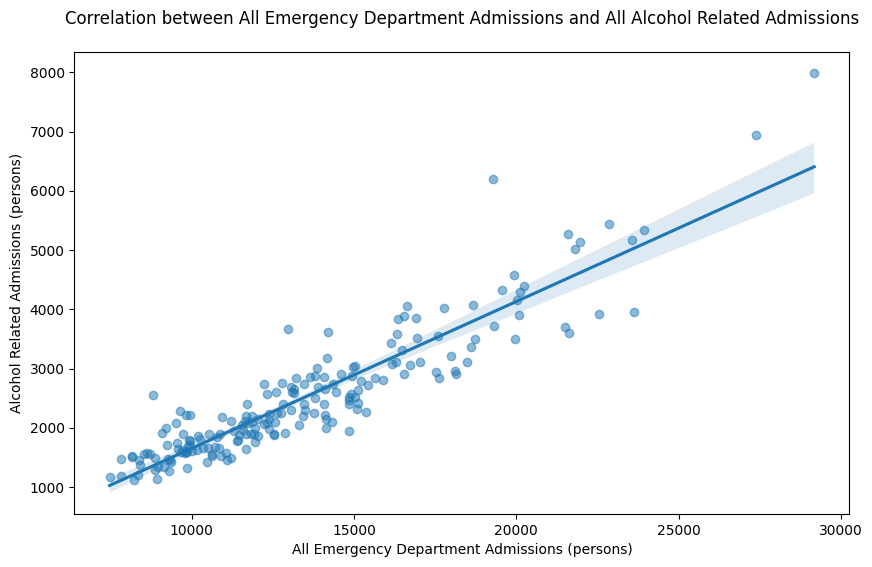

In [19]:
# look at the significance of alcohol related admissions in all emergency department admissions

# create a regression plot

plt.figure(figsize=(10, 6))
sns.regplot(x='all_emerg_dep_admin', y='all_alco_admin', data=hospital_alcohol, scatter_kws={'alpha':0.5})
plt.title('Correlation between All Emergency Department Admissions and All Alcohol Related Admissions', pad=20)
plt.xlabel('All Emergency Department Admissions (persons)')
plt.ylabel('Alcohol Related Admissions (persons)')
plt.show()

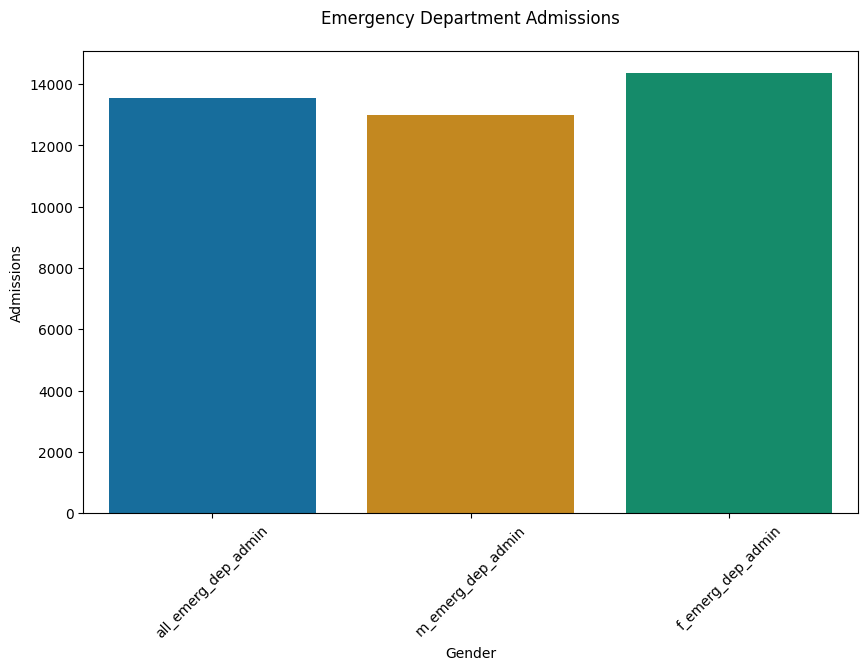

In [20]:
# look at the difference between males and females in all emergency department admissions
# Plot a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=hospital_alcohol[['all_emerg_dep_admin', 'm_emerg_dep_admin', 'f_emerg_dep_admin']], palette='colorblind', errorbar=None)
plt.title('Emergency Department Admissions', pad=20)
plt.xlabel('Gender')
plt.ylabel('Admissions')
plt.xticks(rotation=45)
plt.show()

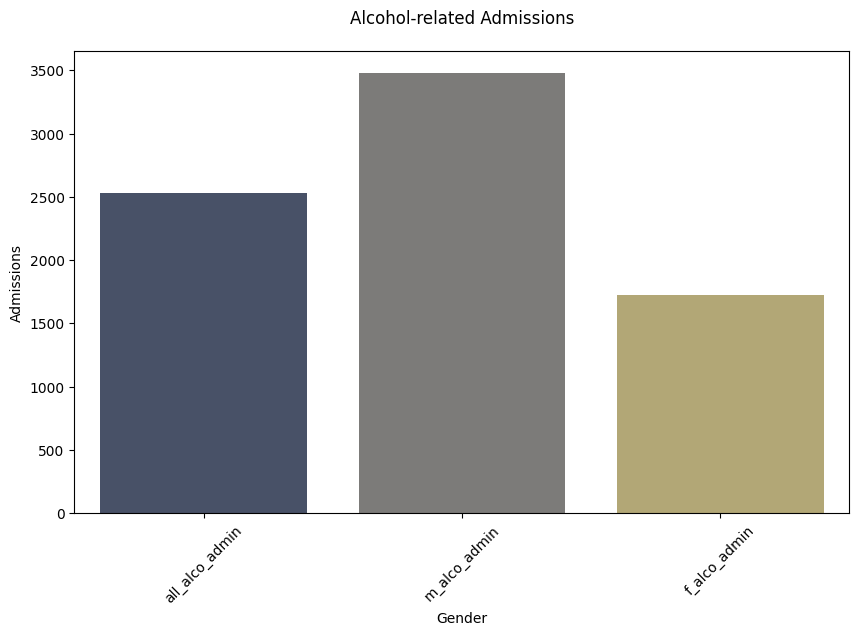

In [21]:
# look at difference between males and females in all alcohol related admissions
# plot a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(data=hospital_alcohol[['all_alco_admin', 'm_alco_admin', 'f_alco_admin']], palette='cividis', errorbar=None)
plt.title('Alcohol-related Admissions', pad=20)
plt.xlabel('Gender')
plt.ylabel('Admissions')
plt.xticks(rotation=45)
plt.show()

In [22]:
# Note that the population is age standardised as mentioned in 1. DATA SUMMARY section.

Emergency department attendances correlate strongly with admissions, especially for severe cases. Alcohol-related admissions are a significant factor, with more males than females in this category, despite females having higher overall admissions.

**2. SECOND DATASET**

In [23]:
# load the second dataset
smoking_asthma = pd.read_csv("Smoking_and_Asthma_Prevalence.csv")

**2.1 DATA SUMMARY**

In [24]:
# look at the number of rows. Number of rows should be same as the first dataset so that they can be joined without any data loss.
smoking_asthma.shape

(190, 16)

In [25]:
# look at the name of columns
smoking_asthma.columns

Index(['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'AllSmoking',
       'MaleSmok', 'FemSmok', 'AllSignifS', 'MaleSigniS', 'FemSigniS',
       'AllAsthma', 'MalAsthma', 'FemAsthma', 'AllAsSigni', 'MaAsSigni',
       'FeAsSigni'],
      dtype='object')

In [26]:
# look at the first 15 rows
smoking_asthma.head(15)

,ogc_fid,lsoa11cd,lsoa11nm,lsoa11nmw,AllSmoking,MaleSmok,FemSmok,AllSignifS,MaleSigniS,FemSigniS,AllAsthma,MalAsthma,FemAsthma,AllAsSigni,MaAsSigni,FeAsSigni
0,5601,E01005761,Stockport 026A,Stockport 026A,27333.92134,25875.49457,28640.664890,Higher,Higher,Higher,"27,333.90","25,875.50","28,640.70",Higher,Higher,Higher
1,5710,E01005870,Stockport 015A,Stockport 015A,20366.83109,20724.95305,20496.833720,Higher,Higher but not significantly so,Higher,"20,366.80","20,725.00","20,496.80",Higher,Higher but not significantly so,Higher
2,5711,E01005871,Stockport 015B,Stockport 015B,20898.53165,22404.74160,19472.911780,Higher,Higher but not significantly so,Higher,"20,898.50","22,404.70","19,472.90",Higher,Higher but not significantly so,Higher
3,5583,E01005743,Stockport 009A,Stockport 009A,17961.28584,18691.00955,17323.007060,Higher but not significantly so,Lower but not significantly so,Higher but not significantly so,"17,961.30","18,691.00","17,323.00",Higher but not significantly so,Lower but not significantly so,Higher but not significantly so
4,5584,E01005744,Stockport 009B,Stockport 009B,20657.89039,22127.65252,19648.069860,Higher,Higher but not significantly so,Higher,"20,657.90","22,127.70","19,648.10",Higher,Higher but not significantly so,Higher
5,5585,E01005745,Stockport 005A,Stockport 005A,17855.07673,19645.70433,16376.298090,Lower but not significantly so,Lower but not significantly so,Higher but not significantly so,"17,855.10","19,645.70","16,376.30",Lower but not significantly so,Lower but not significantly so,Higher but not significantly so
6,5586,E01005746,Stockport 005B,Stockport 005B,28737.84613,29280.52659,28212.842180,Higher,Higher,Higher,"28,737.80","29,280.50","28,212.80",Higher,Higher,Higher
7,5587,E01005747,Stockport 005C,Stockport 005C,12884.19011,14089.48147,11719.033520,Lower,Lower,Lower,"12,884.20","14,089.50","11,719.00",Lower,Lower,Lower
8,5588,E01005748,Stockport 005D,Stockport 005D,10553.26549,12673.59190,8525.299817,Lower,Lower,Lower,"10,553.30","12,673.60","8,525.30",Lower,Lower,Lower
9,5589,E01005749,Stockport 009C,Stockport 009C,15579.40830,16847.17957,14493.445940,Lower,Lower,Lower but not significantly so,"15,579.40","16,847.20","14,493.40",Lower,Lower,Lower but not significantly so


In [27]:
# look at the last 15 rows
smoking_asthma.tail(15)

,ogc_fid,lsoa11cd,lsoa11nm,lsoa11nmw,AllSmoking,MaleSmok,FemSmok,AllSignifS,MaleSigniS,FemSigniS,AllAsthma,MalAsthma,FemAsthma,AllAsSigni,MaAsSigni,FeAsSigni
175,5758,E01005918,Stockport 014D,Stockport 014D,44694.373040,48392.008930,40330.030460,Higher,Higher,Higher,"44,694.40","48,392.00","40,330.00",Higher,Higher,Higher
176,5759,E01005919,Stockport 002E,Stockport 002E,32348.481490,34061.165360,31435.563560,Higher,Higher,Higher,"32,348.50","34,061.20","31,435.60",Higher,Higher,Higher
177,5760,E01005920,Stockport 003D,Stockport 003D,13986.165410,15098.934430,13063.260390,Lower,Lower,Lower,"13,986.20","15,098.90","13,063.30",Lower,Lower,Lower
178,5761,E01005921,Stockport 003E,Stockport 003E,23386.158680,24757.936760,22573.528500,Higher,Higher,Higher,"23,386.20","24,757.90","22,573.50",Higher,Higher,Higher
179,5762,E01005922,Stockport 003F,Stockport 003F,17394.611980,18854.750140,16174.044070,Lower but not significantly so,Lower but not significantly so,Lower but not significantly so,"17,394.60","18,854.80","16,174.00",Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
180,5763,E01005923,Stockport 041C,Stockport 041C,9714.500060,11176.835740,8439.922509,Lower,Lower,Lower,"9,714.50","11,176.80","8,439.90",Lower,Lower,Lower
181,5764,E01005924,Stockport 042A,Stockport 042A,8792.586932,11242.376690,6546.510328,Lower,Lower,Lower,"8,792.60","11,242.40","6,546.50",Lower,Lower,Lower
182,5765,E01005925,Stockport 042B,Stockport 042B,10738.862910,14162.672910,7616.672831,Lower,Lower,Lower,"10,738.90","14,162.70","7,616.70",Lower,Lower,Lower
183,5766,E01005926,Stockport 042C,Stockport 042C,11618.612680,13246.971140,10154.772060,Lower,Lower,Lower,"11,618.60","13,247.00","10,154.80",Lower,Lower,Lower
184,5767,E01005927,Stockport 032A,Stockport 032A,11051.852080,14606.077310,7678.975075,Lower,Lower,Lower,"11,051.90","14,606.10","7,679.00",Lower,Lower,Lower


**2.2. DATA PREPROCESSING**

2.2.1. Changing names of the columns

In [28]:
# similar to the previous dataset, column names should be changed.
# it helps us to make the further data analysis easier
cols2 = ['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'all_smoke','m_smoke', 'f_smoke', 'all_signi_smoke', 'm_signi_smoke', 'f_signi_smoke','all_asthma', 'm_asthma', 'f_asthma', 'all_asthma_signi', 'm_asthma_signi','f_asthma_signi']
smoking_asthma = pd.read_csv("Smoking_and_Asthma_Prevalence.csv", header=None, skiprows=1, names=cols2)


In [29]:
# look at the new updated columns
smoking_asthma.columns

Index(['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'all_smoke', 'm_smoke',
       'f_smoke', 'all_signi_smoke', 'm_signi_smoke', 'f_signi_smoke',
       'all_asthma', 'm_asthma', 'f_asthma', 'all_asthma_signi',
       'm_asthma_signi', 'f_asthma_signi'],
      dtype='object')

2.2.2. Checking Data Types and Null Values

In [30]:
# look at the summary of the data structure
smoking_asthma.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ogc_fid           190 non-null    int64  
 1   lsoa11cd          190 non-null    object 
 2   lsoa11nm          190 non-null    object 
 3   lsoa11nmw         190 non-null    object 
 4   all_smoke         190 non-null    float64
 5   m_smoke           190 non-null    float64
 6   f_smoke           190 non-null    float64
 7   all_signi_smoke   190 non-null    object 
 8   m_signi_smoke     190 non-null    object 
 9   f_signi_smoke     190 non-null    object 
 10  all_asthma        190 non-null    object 
 11  m_asthma          190 non-null    object 
 12  f_asthma          190 non-null    object 
 13  all_asthma_signi  190 non-null    object 
 14  m_asthma_signi    190 non-null    object 
 15  f_asthma_signi    190 non-null    object 
dtypes: float64(3), int64(1), object(12)
memory u

In [31]:
# similar to the previous dataset, we will remove commas (,) in the columns containing numerical values and change the data type as well
columns_to_convert = ['all_asthma', 'm_asthma', 'f_asthma']

for col in columns_to_convert:
    smoking_asthma[col] = smoking_asthma[col].str.replace(',', '').astype(float)

In [32]:
# check the updated data
smoking_asthma.dtypes

ogc_fid               int64
lsoa11cd             object
lsoa11nm             object
lsoa11nmw            object
all_smoke           float64
m_smoke             float64
f_smoke             float64
all_signi_smoke      object
m_signi_smoke        object
f_signi_smoke        object
all_asthma          float64
m_asthma            float64
f_asthma            float64
all_asthma_signi     object
m_asthma_signi       object
f_asthma_signi       object
dtype: object

In [33]:
# look and count the number of null values
smoking_asthma.isnull().sum()

ogc_fid             0
lsoa11cd            0
lsoa11nm            0
lsoa11nmw           0
all_smoke           0
m_smoke             0
f_smoke             0
all_signi_smoke     0
m_signi_smoke       0
f_signi_smoke       0
all_asthma          0
m_asthma            0
f_asthma            0
all_asthma_signi    0
m_asthma_signi      0
f_asthma_signi      0
dtype: int64

In [34]:
# look at the unique values in some of the categorical data columns to understand the distribution of data
smoking_asthma["all_signi_smoke"].unique()

array(['Higher', 'Higher but not significantly so',
       'Lower but not significantly so', 'Lower'], dtype=object)

In [35]:
smoking_asthma["f_asthma_signi"].unique()

array(['Higher', 'Higher but not significantly so', 'Lower',
       'Lower but not significantly so'], dtype=object)

In [36]:
# look at descriptive statistics
smoking_asthma.describe()

,ogc_fid,all_smoke,m_smoke,f_smoke,all_asthma,m_asthma,f_asthma
count,190.000000,190.000000,190.000000,190.000000,190.000000,190.000000,190.000000
mean,5677.500000,17837.065108,19817.660255,16151.616337,17837.068947,19817.658947,16151.616316
std,54.992424,8061.178923,8000.346929,8310.100373,8061.177941,8000.349834,8310.097735
min,5583.000000,7826.905427,8343.516685,5570.187247,7826.900000,8343.500000,5570.200000
25%,5630.250000,11437.108212,13851.862295,9247.892410,11437.125000,13851.825000,9247.850000
50%,5677.500000,15772.690615,18072.761735,14282.849940,15772.650000,18072.750000,14282.850000
75%,5724.750000,22869.893703,24930.432702,20950.946870,22869.875000,24930.400000,20950.975000
max,5772.000000,44694.373040,48392.008930,41507.504110,44694.400000,48392.000000,41507.500000


**2.3. DATA EXPLORATION**

In [37]:
# although it is expected that smokers and asthmatics will be highly correlated, we will look at the exact correlation

In [38]:
# look at the correlation between 'all_smoke' and 'all_asthma'
from scipy.stats import pearsonr

# Calculate Pearson correlation
corr, p_value = pearsonr(smoking_asthma['all_smoke'], smoking_asthma['all_asthma'])

print('Pearson correlation coefficient:', corr)
print('P-value:', p_value)


Pearson correlation coefficient: 0.9999999999932146
P-value: 0.0


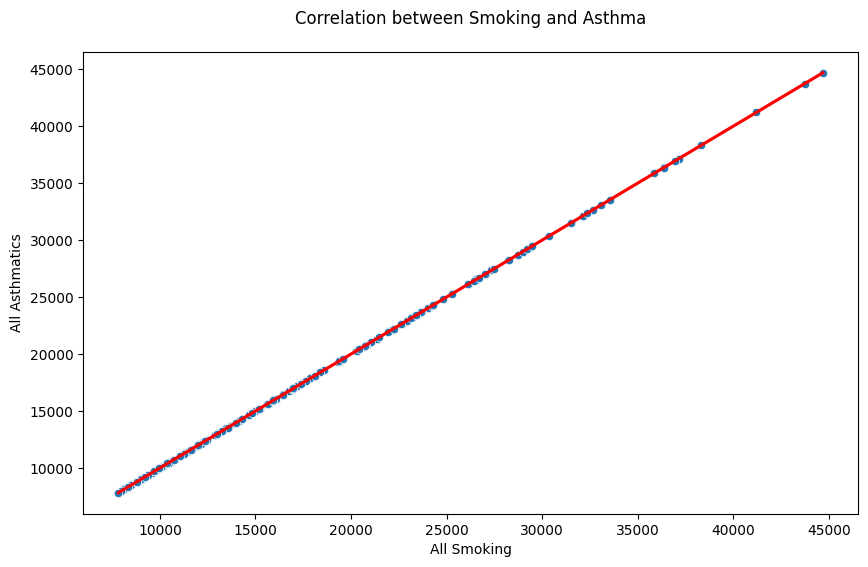

In [39]:
# plot this correlation
plt.figure(figsize=(10, 6))
sns.scatterplot(x='all_smoke', y='all_asthma', data=smoking_asthma)
sns.regplot(x='all_smoke', y='all_asthma', data=smoking_asthma, scatter=False, color='red')
plt.title('Correlation between Smoking and Asthma', pad=20)
plt.xlabel('All Smoking')
plt.ylabel('All Asthmatics')

plt.show()

In [40]:
# the correaltion is significantly high (0.9) but p value of (0.0) is very rare.
# look further at other variables

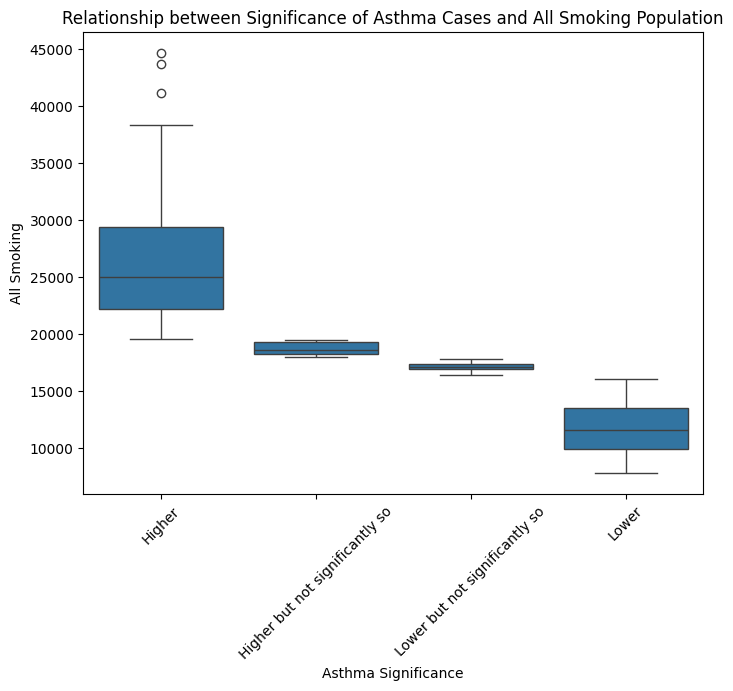

In [41]:
# look at the asthma significance with all smoking
plt.figure(figsize=(8, 6))
sns.boxplot(x='all_asthma_signi', y='all_smoke', data=smoking_asthma)
plt.title('Relationship between Significance of Asthma Cases and All Smoking Population')
plt.xlabel('Asthma Significance')
plt.ylabel('All Smoking')
plt.xticks(rotation=45)
plt.show()

There is a clear positive correlation between smoking prevalence and asthma cases. Higher smoking rates are associated with higher levels of asthma significance, suggesting that smoking is a significant risk factor for asthma in this population.

**3. THIRD DATASET**

In [42]:
# load the third dataset
chronic_health = pd.read_csv("Local_Health_Characteristics.csv")

**3.1 DATA SUMMARY**

In [43]:
# look at the number of rows.
chronic_health.shape

(190, 18)

In [44]:
# look at the name of columns
chronic_health.columns

Index(['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'GPRegPop', 'Hypertens',
       'Anxiety', 'Depression', 'Asthma', 'Obesity', 'Diabetes', 'CHD', 'Fall',
       'Cancer', 'CKD', 'COPD', 'Stroke_TIA', 'AF'],
      dtype='object')

In [45]:
# look at the first 15 rows
chronic_health.head(15)

,ogc_fid,lsoa11cd,lsoa11nm,lsoa11nmw,GPRegPop,Hypertens,Anxiety,Depression,Asthma,Obesity,Diabetes,CHD,Fall,Cancer,CKD,COPD,Stroke_TIA,AF
0,5601,E01005761,Stockport 026A,Stockport 026A,1495,165,163,175,110,102,63,47,51,25,17,36,33,19
1,5710,E01005870,Stockport 015A,Stockport 015A,1457,203,191,173,92,90,62,58,80,38,35,35,33,29
2,5711,E01005871,Stockport 015B,Stockport 015B,1343,190,191,171,104,96,68,53,50,25,24,29,23,21
3,5583,E01005743,Stockport 009A,Stockport 009A,1391,269,131,100,102,125,54,51,33,43,39,31,23,18
4,5584,E01005744,Stockport 009B,Stockport 009B,1459,265,161,133,92,124,96,87,85,41,58,50,51,38
5,5585,E01005745,Stockport 005A,Stockport 005A,1450,200,162,142,93,114,70,51,33,35,21,30,22,15
6,5586,E01005746,Stockport 005B,Stockport 005B,1497,330,217,206,107,160,111,116,56,52,72,95,56,44
7,5587,E01005747,Stockport 005C,Stockport 005C,1406,192,111,94,85,80,49,36,24,37,20,18,18,23
8,5588,E01005748,Stockport 005D,Stockport 005D,1557,293,108,89,90,101,74,85,27,68,51,27,32,47
9,5589,E01005749,Stockport 009C,Stockport 009C,1705,255,172,126,82,147,91,57,47,42,44,39,25,24


In [46]:
# look at the last 15 rows
chronic_health.tail(15)

,ogc_fid,lsoa11cd,lsoa11nm,lsoa11nmw,GPRegPop,Hypertens,Anxiety,Depression,Asthma,Obesity,Diabetes,CHD,Fall,Cancer,CKD,COPD,Stroke_TIA,AF
175,5758,E01005918,Stockport 014D,Stockport 014D,1719,234,226,236,112,160,127,78,78,34,39,98,59,39
176,5759,E01005919,Stockport 002E,Stockport 002E,1638,188,140,171,105,122,69,46,51,24,38,53,31,26
177,5760,E01005920,Stockport 003D,Stockport 003D,1705,261,131,114,122,139,85,65,49,37,56,26,25,26
178,5761,E01005921,Stockport 003E,Stockport 003E,1582,198,132,140,135,136,95,67,38,34,36,42,31,34
179,5762,E01005922,Stockport 003F,Stockport 003F,1440,264,116,116,85,116,85,62,27,47,37,46,23,25
180,5763,E01005923,Stockport 041C,Stockport 041C,1553,258,94,78,85,46,56,61,51,57,30,20,25,42
181,5764,E01005924,Stockport 042A,Stockport 042A,1460,208,86,75,71,30,32,42,44,56,34,17,34,39
182,5765,E01005925,Stockport 042B,Stockport 042B,1423,268,98,103,83,44,77,76,62,66,36,24,49,52
183,5766,E01005926,Stockport 042C,Stockport 042C,1068,187,62,62,45,33,45,43,34,36,20,8,27,33
184,5767,E01005927,Stockport 032A,Stockport 032A,1440,176,139,126,91,62,60,41,47,39,22,17,21,32


**3.2 DATA PREPROCESSING**

3.2.1 Updating the column names

In [47]:
# although all the column names clearly signify the health condition, we will change the initials to small letters for consistency in the whole project
cols3 = ['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'gp_reg_pop', 'hypertens','anxiety', 'depression', 'asthma', 'obesity', 'diabetes', 'cheart_d', 'fall','cancer', 'ckidney_d', 'copulmonaryd', 'stroke', 'atrial_fibrillation']
chronic_health = pd.read_csv("Local_Health_Characteristics.csv", header=None, skiprows=1, names=cols3)

In [48]:
# look at the updated column names
chronic_health.columns

Index(['ogc_fid', 'lsoa11cd', 'lsoa11nm', 'lsoa11nmw', 'gp_reg_pop',
       'hypertens', 'anxiety', 'depression', 'asthma', 'obesity', 'diabetes',
       'cheart_d', 'fall', 'cancer', 'ckidney_d', 'copulmonaryd', 'stroke',
       'atrial_fibrillation'],
      dtype='object')

3.2.2 Checking data types and null values

In [49]:
chronic_health.dtypes

ogc_fid                 int64
lsoa11cd               object
lsoa11nm               object
lsoa11nmw              object
gp_reg_pop              int64
hypertens               int64
anxiety                 int64
depression              int64
asthma                  int64
obesity                 int64
diabetes                int64
cheart_d                int64
fall                    int64
cancer                  int64
ckidney_d               int64
copulmonaryd            int64
stroke                  int64
atrial_fibrillation     int64
dtype: object

In [50]:
# no need to change any data type, all are specified by an appropriate data type.

In [51]:
# look at the number of null values
chronic_health.isnull().sum()

ogc_fid                0
lsoa11cd               0
lsoa11nm               0
lsoa11nmw              0
gp_reg_pop             0
hypertens              0
anxiety                0
depression             0
asthma                 0
obesity                0
diabetes               0
cheart_d               0
fall                   0
cancer                 0
ckidney_d              0
copulmonaryd           0
stroke                 0
atrial_fibrillation    0
dtype: int64

**3.3 DATA EXPLORATION**

In [52]:
# the dataset contains prevalence of variety of health conditions in Stockport
# look at the correlation between all the conditions

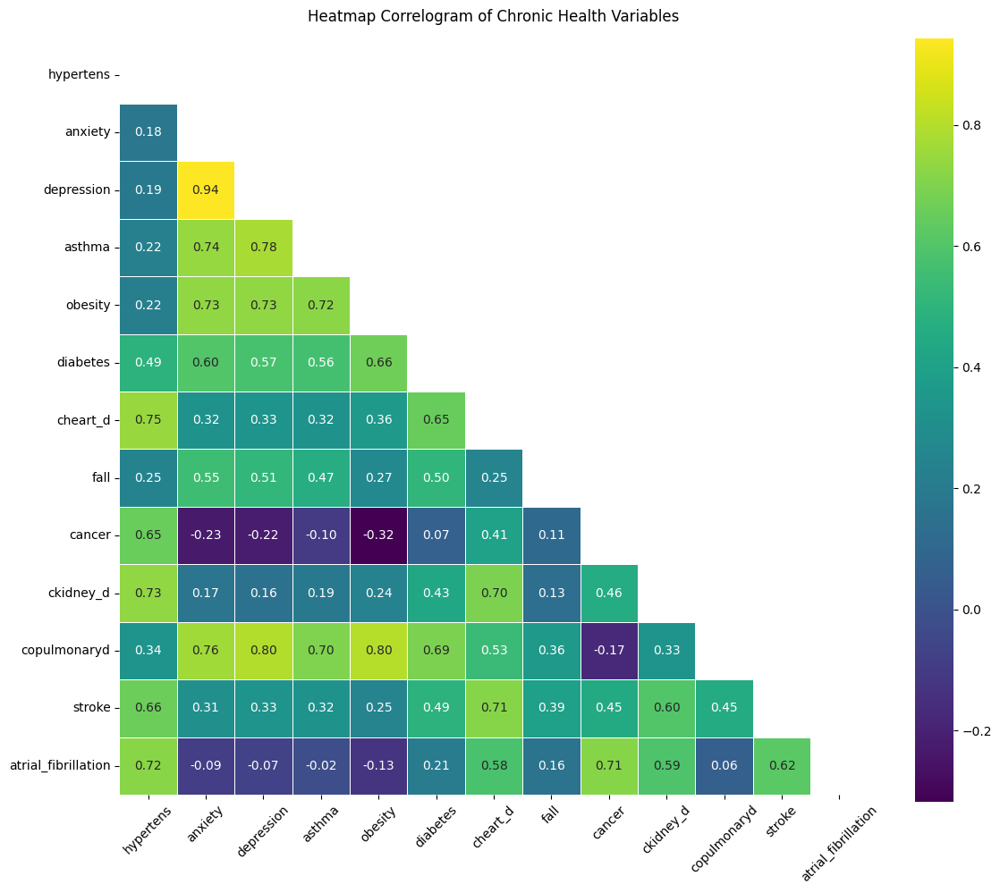

In [53]:
# Create a DataFrame constituting of all the columns
all_variables = ['hypertens', 'anxiety', 'depression', 'asthma', 'obesity', 'diabetes',
                 'cheart_d', 'fall', 'cancer', 'ckidney_d', 'copulmonaryd', 'stroke',
                 'atrial_fibrillation']
chronic_health_df = pd.DataFrame(chronic_health)

# Select the desired variables from the DataFrame
df_selected = chronic_health_df[all_variables]

# Calculate the correlation matrix
correlation_matrix = df_selected.corr()

# Define plot size
fig, ax = plt.subplots(figsize=(12, 10))

# add a mask. It will enable to reduce clutter and improve the visual interpretation (matplotlib)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# plot using a heatmap correlogram
# use a colorblind friendly colour scheme
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5,
            square=True, mask=mask, ax=ax)
plt.title("Heatmap Correlogram of Chronic Health Variables", pad=20)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


The strongest associations are between anxiety and depression and obesity and diabetes. Falls, cancer, kidney disease, COPD, stroke, and atrial fibrillation have weaker correlations overall.
However, correlation doesn't necessarily imply causation between these variables.

**4. CREATING THE FOURTH DATASET FOR THE CORE ANALYSIS OF THIS REPORT**

The joined datasets will help us analyse the relationship between consumption of alcohol, smoking, chronic health conditions with the population registered to a general practitioner.

In [54]:
# merge the three datasets using .merge function from the pandas library

# merge the 'chronic_health' dataset with 'smoking_asthma_ dataset
merged_df = chronic_health.merge(smoking_asthma, on='lsoa11cd', how='inner')
# merge the 'hospital_alcohol' dataset with the previously merged dataset
merged_df = merged_df.merge(hospital_alcohol, on='lsoa11cd', how='inner')

In [55]:
# give a suitable title to the merged dataframe and delete the previous title 'merged_df'
# although a suitable title could also be given in the previous step, but was avoided to maintain simplicity
combined_health_data = merged_df
del merged_df

**4.1 DATA SUMMARY AND PREPROCESSING**

Even after cleaning individual datasets and joining them, it's  necessary to perform additional cleaning or preprocessing steps on the combined dataset to ensure its quality and usability.

In [56]:
# check if the 'combined_health_data' joined correctly or not

In [57]:
# look at the number of rows and columns
combined_health_data.shape

(190, 54)

In [58]:
# look at all the names of the columns
combined_health_data.columns

Index(['ogc_fid_x', 'lsoa11cd', 'lsoa11nm_x', 'lsoa11nmw_x', 'gp_reg_pop',
       'hypertens', 'anxiety', 'depression', 'asthma', 'obesity', 'diabetes',
       'cheart_d', 'fall', 'cancer', 'ckidney_d', 'copulmonaryd', 'stroke',
       'atrial_fibrillation', 'ogc_fid_y', 'lsoa11nm_y', 'lsoa11nmw_y',
       'all_smoke', 'm_smoke', 'f_smoke', 'all_signi_smoke', 'm_signi_smoke',
       'f_signi_smoke', 'all_asthma', 'm_asthma', 'f_asthma',
       'all_asthma_signi', 'm_asthma_signi', 'f_asthma_signi', 'ogc_fid',
       'lsoa11nm', 'lsoa11nmw', 'all_emerg_dep_attend', 'm_emerg_dep_attend',
       'f_emerg_dep_attend', 'all_emerg_dep_attend_signi',
       'm_emerg_dep_attend_signi', 'f_emerg_dep_attend_signi',
       'all_emerg_dep_admin', 'm_emerg_dep_admin', 'f_emerg_dep_admin',
       'all_emerg_dep_admin_signi', 'm_emerg_dep_admin_signi',
       'f_emerg_Dep_admin_signi', 'all_alco_admin', 'm_alco_admin',
       'f_alco_admin', 'all_alco_admin_signi', 'm_alco_admin_signi',
       'f_alc

In [59]:
# check to see if there are any duplicated rows
# The duplicated() method returns a Series with True and False values that describe which rows in the DataFrame are duplicated and not
# there are 190 rows, rather than seeing all 190 rows, we will just look at the number of duplicated rows, if there are any

# count the number of duplicated rows
combined_health_data.duplicated().sum()

0

In [60]:
# look at a concise summary of the dataframe
combined_health_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ogc_fid_x                   190 non-null    int64  
 1   lsoa11cd                    190 non-null    object 
 2   lsoa11nm_x                  190 non-null    object 
 3   lsoa11nmw_x                 190 non-null    object 
 4   gp_reg_pop                  190 non-null    int64  
 5   hypertens                   190 non-null    int64  
 6   anxiety                     190 non-null    int64  
 7   depression                  190 non-null    int64  
 8   asthma                      190 non-null    int64  
 9   obesity                     190 non-null    int64  
 10  diabetes                    190 non-null    int64  
 11  cheart_d                    190 non-null    int64  
 12  fall                        190 non-null    int64  
 13  cancer                      190 non

**4.2 DATA EXPLORATION**

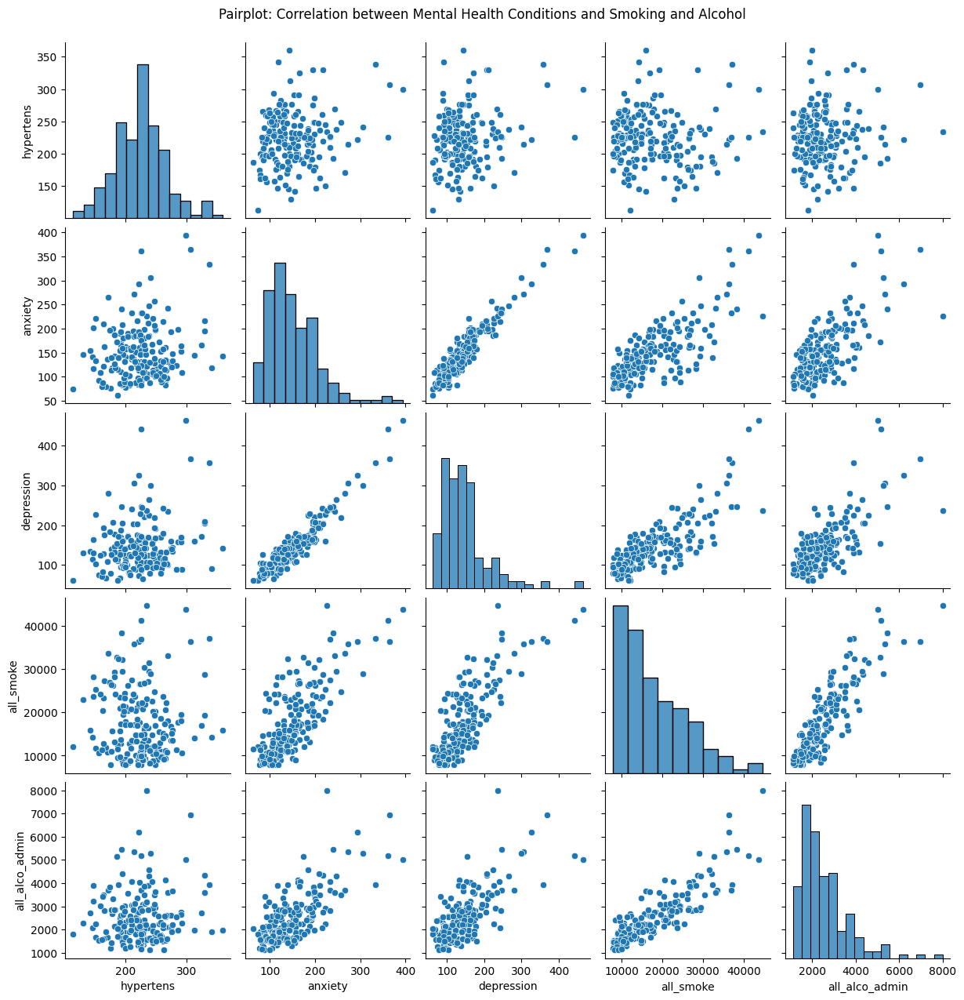

In [61]:
# look at the correlation between all smoking, all alcohol with mental health related conditions

# select the desired variables for the pairplot
mental_health_variables = ['hypertens', 'anxiety', 'depression', 'all_smoke', 'all_alco_admin']

# Create the pairplot
sns.pairplot(combined_health_data[mental_health_variables], height=2.5)

# Add a title to the plot
plt.suptitle("Pairplot: Correlation between Mental Health Conditions and Smoking and Alcohol", y=1.02)

# Show the plot
plt.show()

There are no clear correlations between smoking or drinking alcohol and the mental health conditions, as the points appear scattered without a distinct pattern. Although a slightly weaker correlation can be seen amongst all_smoking and hypertension and anxiety.

In [62]:
# look at the proportion of population suffering from chronic health conditions, substance abuse and registered with a general practitioner

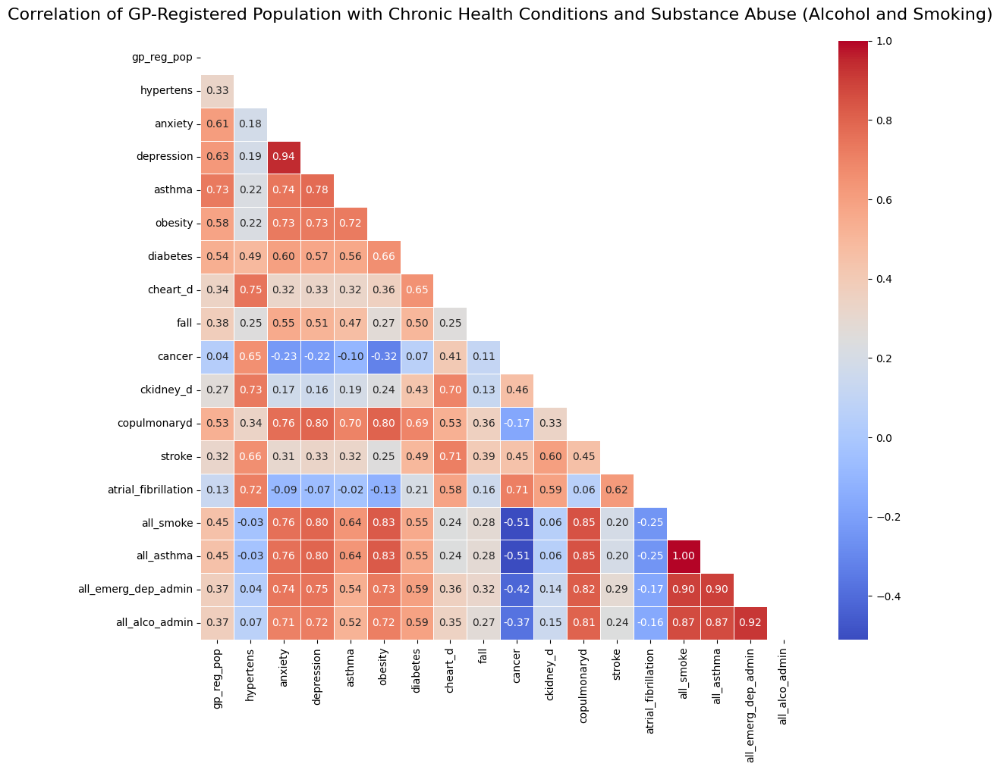

In [63]:
variables = ['gp_reg_pop', 'hypertens', 'anxiety', 'depression', 'asthma', 'obesity', 'diabetes', 'cheart_d', 'fall', 'cancer', 'ckidney_d', 'copulmonaryd', 'stroke', 'atrial_fibrillation', 'all_smoke', 'all_asthma', 'all_emerg_dep_admin', 'all_alco_admin']

# select the  variables from the combined_health_data
df_selected = combined_health_data[variables]

# calculate the correlation matrix using the default Pearson Correlation Coefficient
correlation_matrix = df_selected.corr()

# generate a mask for the upper triangle for clear and concise visualisation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# plot the correlation using heatmap
plt.figure(figsize=(12, 10))

# create the heatmap
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, square=True)

# add a title to the heatmap
plt.title("Correlation of GP-Registered Population with Chronic Health Conditions and Substance Abuse (Alcohol and Smoking)", fontsize=16, pad=20)

# adjust the layout to prevent overlapping labels
plt.tight_layout()


plt.show()

The output suggests that areas with a higher proportion of the population registered with GPs tend to have lower rates of most chronic health conditions and substance abuse problems with some exceptions like asthma, depression, anxiety and obesity. This is evident from the largely negative correlations between GP registration and chronic health condition. These findings imply that higher GP registration rates may be associated with better management and prevention of chronic health issues, leading to reduced hospital admissions.

**5. SPATIAL DATA VISUALISATION**

In [64]:
# load the required packages (spatial packages and mathematical algorithms)
! pip install geopandas
! pip install folium
! pip install pysal
! pip install pandas scipy
! pip install libpysal
!pip install matplotlib-scalebar

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.4/132.4 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 331.8/331.8 kB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 39.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━

In [65]:
import geopandas as gpd
import folium
import pysal as ps
import libpysal
from libpysal import weights
from esda.getisord import G_Local
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar

In [66]:
# add Stockport Shapefile
stockport_geo = gpd.read_file("Stockport_shp.shp")

**5.1 DATA SUMMARY**

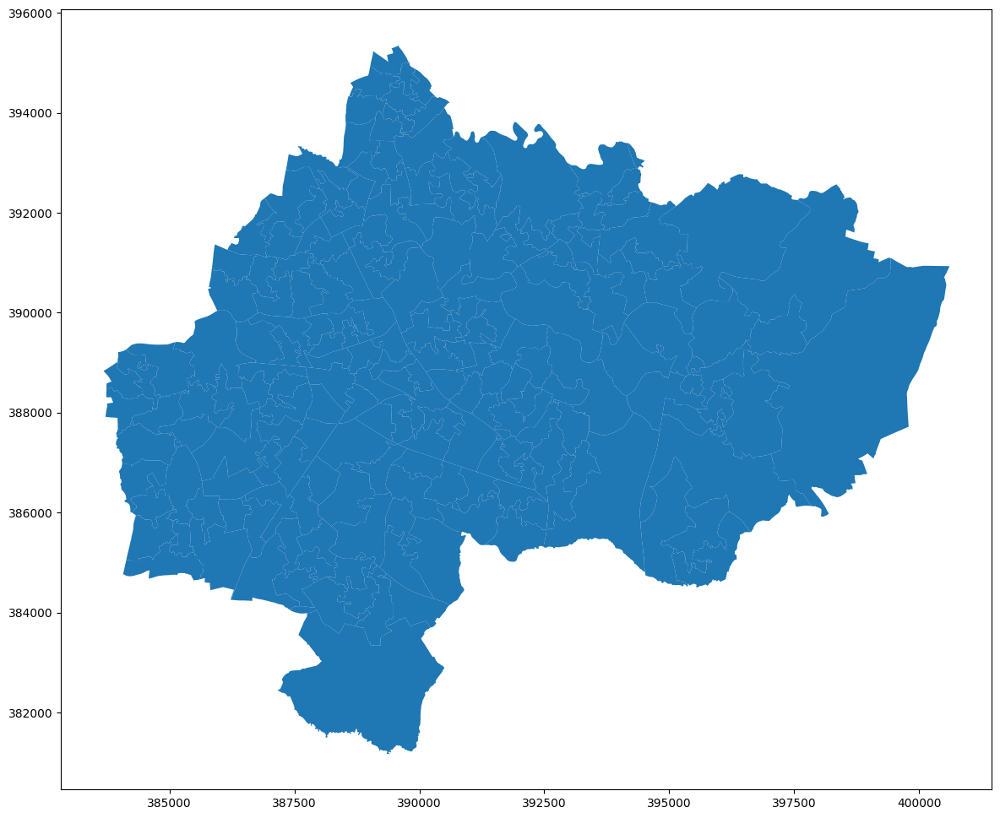

In [67]:
fig, ax = plt.subplots(figsize=(18, 12))
stockport_geo.plot(ax=ax) ;

In [68]:
# check the Coordinate Reference System along with the datum and coordinate operation
# GeoDataFrames, a subclass of pandas DataFrames, stores geometry columns for spatial operations, with each column containing Coordinate Reference System (CRS) information to ensure accurate spatial data manipulation (Rafaat, 2023).
stockport_geo.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [69]:
# check the column names
stockport_geo.columns

Index(['geo_code', 'geo_label', 'geo_labelw', 'label', 'name', 'geometry'], dtype='object')

In [70]:
# look at the first 5 columns to identify the column which contains the lsoa code and lsoa label to allow us to filter Stockport LSOAs and join them later with our merged health datasets
stockport_geo.head(5)

,geo_code,geo_label,geo_labelw,label,name,geometry
0,E01005778,Stockport 022B,None,E92000001E08000007E01005778,Stockport 022B,"POLYGON ((387193.198 388800.308, 387190.939 38..."
1,E01005743,Stockport 009A,None,E92000001E08000007E01005743,Stockport 009A,"POLYGON ((391890.268 391482.835, 391885.977 39..."
2,E01005898,Stockport 010B,None,E92000001E08000007E01005898,Stockport 010B,"POLYGON ((395485.992 392331.881, 395489.906 39..."
3,E01005906,Stockport 038B,None,E92000001E08000007E01005906,Stockport 038B,"POLYGON ((395851.885 385000.848, 395850.977 38..."
4,E01005822,Stockport 016D,None,E92000001E08000007E01005822,Stockport 016D,"POLYGON ((388904.127 389879.364, 388903.270 38..."


In [71]:
# check the number of rows in the new Shapefile, it should match the number of LSOAs in our health datasets to join them with the Shapefile
stockport_geo.shape

(190, 6)

In [72]:
# we can initiate the data joining
# join the Stockport LSOA boundary data with our joint health dataset
# merge based on the common column lsoa11cd and geocode

stockport_health = pd.merge(stockport_geo,combined_health_data,left_on='geo_code',right_on='lsoa11cd',  how='inner')



In [73]:
# look at the first 5 rows
stockport_health.head(5)

,geo_code,geo_label,geo_labelw,label,name,geometry,ogc_fid_x,lsoa11cd,lsoa11nm_x,lsoa11nmw_x,...,f_emerg_dep_admin,all_emerg_dep_admin_signi,m_emerg_dep_admin_signi,f_emerg_Dep_admin_signi,all_alco_admin,m_alco_admin,f_alco_admin,all_alco_admin_signi,m_alco_admin_signi,f_alco_admin_signi
0,E01005778,Stockport 022B,None,E92000001E08000007E01005778,Stockport 022B,"POLYGON ((387193.198 388800.308, 387190.939 38...",5618,E01005778,Stockport 022B,Stockport 022B,...,13752.22789,Lower but not significantly so,Lower but not significantly so,Lower but not significantly so,2251.3,3078.7,1472.9,Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
1,E01005743,Stockport 009A,None,E92000001E08000007E01005743,Stockport 009A,"POLYGON ((391890.268 391482.835, 391885.977 39...",5583,E01005743,Stockport 009A,Stockport 009A,...,11582.04023,Lower,Lower but not significantly so,Lower,2112.3,2805.5,1453.8,Lower but not significantly so,Lower but not significantly so,Lower but not significantly so
2,E01005898,Stockport 010B,None,E92000001E08000007E01005898,Stockport 010B,"POLYGON ((395485.992 392331.881, 395489.906 39...",5738,E01005898,Stockport 010B,Stockport 010B,...,12386.40536,Lower,Lower but not significantly so,Lower,2744.3,4135.1,1405.2,Higher but not significantly so,Higher but not significantly so,Lower but not significantly so
3,E01005906,Stockport 038B,None,E92000001E08000007E01005906,Stockport 038B,"POLYGON ((395851.885 385000.848, 395850.977 38...",5746,E01005906,Stockport 038B,Stockport 038B,...,16560.90152,Higher,Higher but not significantly so,Higher,2565.2,3269.2,1897.7,Higher but not significantly so,Lower but not significantly so,Higher but not significantly so
4,E01005822,Stockport 016D,None,E92000001E08000007E01005822,Stockport 016D,"POLYGON ((388904.127 389879.364, 388903.270 38...",5662,E01005822,Stockport 016D,Stockport 016D,...,25020.57265,Higher,Higher,Higher,5335.5,6770.8,4103.3,Higher,Higher,Higher


In [74]:
# look at the last 5 rows
stockport_health.tail(5)

,geo_code,geo_label,geo_labelw,label,name,geometry,ogc_fid_x,lsoa11cd,lsoa11nm_x,lsoa11nmw_x,...,f_emerg_dep_admin,all_emerg_dep_admin_signi,m_emerg_dep_admin_signi,f_emerg_Dep_admin_signi,all_alco_admin,m_alco_admin,f_alco_admin,all_alco_admin_signi,m_alco_admin_signi,f_alco_admin_signi
185,E01005849,Stockport 036C,None,E92000001E08000007E01005849,Stockport 036C,"POLYGON ((384742.413 385845.517, 384741.968 38...",5689,E01005849,Stockport 036C,Stockport 036C,...,12093.88145,Lower,Lower but not significantly so,Lower,1769.2,2195.5,1445.7,Lower,Lower,Lower but not significantly so
186,E01005917,Stockport 007D,None,E92000001E08000007E01005917,Stockport 007D,"POLYGON ((388673.094 391139.168, 388671.406 39...",5757,E01005917,Stockport 007D,Stockport 007D,...,21783.42623,Higher,Higher but not significantly so,Higher,2958.2,3902.3,2235.5,Higher but not significantly so,Higher but not significantly so,Higher but not significantly so
187,E01005847,Stockport 040B,None,E92000001E08000007E01005847,Stockport 040B,"POLYGON ((385169.281 385586.483, 385165.450 38...",5687,E01005847,Stockport 040B,Stockport 040B,...,10545.92215,Lower,Lower,Lower,1664.2,2217.8,1179.7,Lower,Lower,Lower but not significantly so
188,E01005765,Stockport 018A,None,E92000001E08000007E01005765,Stockport 018A,"POLYGON ((388263.042 389215.829, 388265.033 38...",5605,E01005765,Stockport 018A,Stockport 018A,...,12834.14842,Lower,Lower,Lower but not significantly so,1895.2,2547.5,1371.8,Lower,Lower but not significantly so,Lower but not significantly so
189,E01005819,Stockport 018C,None,E92000001E08000007E01005819,Stockport 018C,"POLYGON ((386740.253 389056.000, 386743.313 38...",5659,E01005819,Stockport 018C,Stockport 018C,...,14132.24147,Higher but not significantly so,Higher but not significantly so,Lower but not significantly so,2405.2,3933.3,1006.1,Lower but not significantly so,Higher but not significantly so,Lower


**5.2 DATA EXPLORATION**

In [75]:
# look at the spatial dataframe of Stockport
stockport_health.explore()

In [76]:
# look at the number of rows, columns and name of all the columns
stockport_health.shape

(190, 60)

In [77]:
stockport_health.columns

Index(['geo_code', 'geo_label', 'geo_labelw', 'label', 'name', 'geometry',
       'ogc_fid_x', 'lsoa11cd', 'lsoa11nm_x', 'lsoa11nmw_x', 'gp_reg_pop',
       'hypertens', 'anxiety', 'depression', 'asthma', 'obesity', 'diabetes',
       'cheart_d', 'fall', 'cancer', 'ckidney_d', 'copulmonaryd', 'stroke',
       'atrial_fibrillation', 'ogc_fid_y', 'lsoa11nm_y', 'lsoa11nmw_y',
       'all_smoke', 'm_smoke', 'f_smoke', 'all_signi_smoke', 'm_signi_smoke',
       'f_signi_smoke', 'all_asthma', 'm_asthma', 'f_asthma',
       'all_asthma_signi', 'm_asthma_signi', 'f_asthma_signi', 'ogc_fid',
       'lsoa11nm', 'lsoa11nmw', 'all_emerg_dep_attend', 'm_emerg_dep_attend',
       'f_emerg_dep_attend', 'all_emerg_dep_attend_signi',
       'm_emerg_dep_attend_signi', 'f_emerg_dep_attend_signi',
       'all_emerg_dep_admin', 'm_emerg_dep_admin', 'f_emerg_dep_admin',
       'all_emerg_dep_admin_signi', 'm_emerg_dep_admin_signi',
       'f_emerg_Dep_admin_signi', 'all_alco_admin', 'm_alco_admin',
       

In [78]:
# create multiple maps to analyse the spatial patterns of the data

In [79]:
# import required package
from matplotlib.colors import ListedColormap

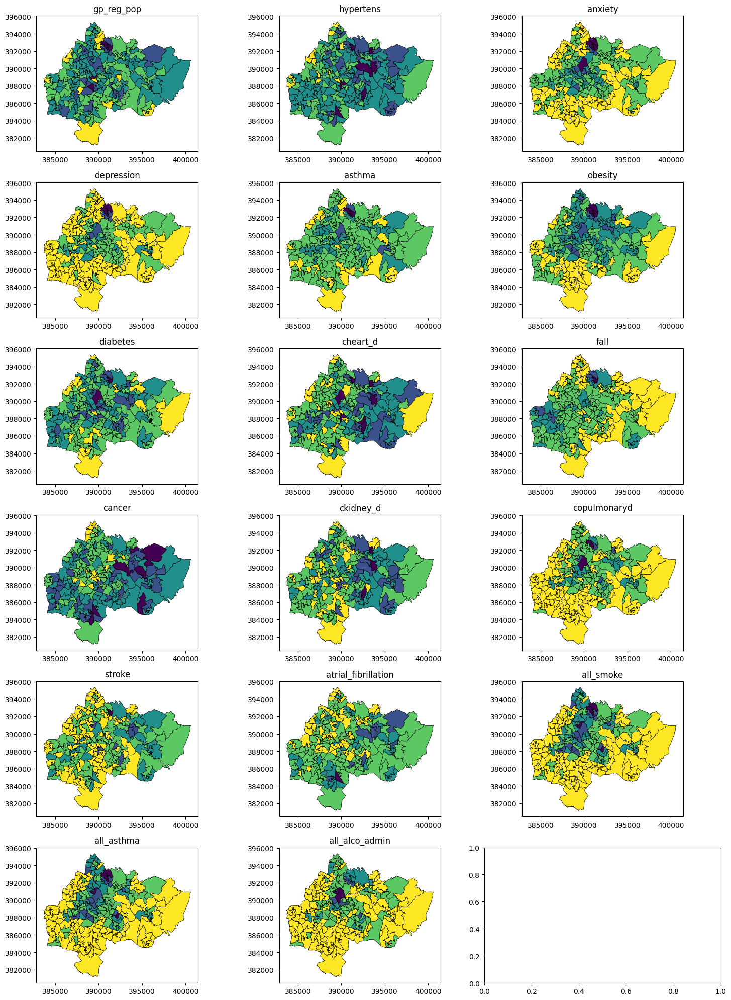

In [80]:
# Define the number of categories
num_categories = 5

# Create a colorblind-friendly colormap
cmap = plt.cm.viridis_r

# Get equally spaced colors from the colormap
colors = cmap(np.linspace(0, 1, num_categories))

# Create a ListedColormap
new_cmap = ListedColormap(colors)

# List of variables
variables = ['gp_reg_pop', 'hypertens', 'anxiety', 'depression', 'asthma', 'obesity',
             'diabetes', 'cheart_d', 'fall', 'cancer', 'ckidney_d', 'copulmonaryd',
             'stroke', 'atrial_fibrillation', 'all_smoke', 'all_asthma', 'all_alco_admin']

# Set up the figure and axes
fig, axes = plt.subplots(6, 3, figsize=(15, 20))

# flatten the axes
axes = axes.flatten()

# loop through each variable and create a map
for i, variable in enumerate(variables):
    stockport_health.plot(column=variable, cmap=new_cmap, ax=axes[i], legend=False, edgecolor='black', linewidth=0.5)
    axes[i].set_title(variable)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [81]:
# Visualise the concentration of population registered with GP using Getis Ord Gi* algorithm

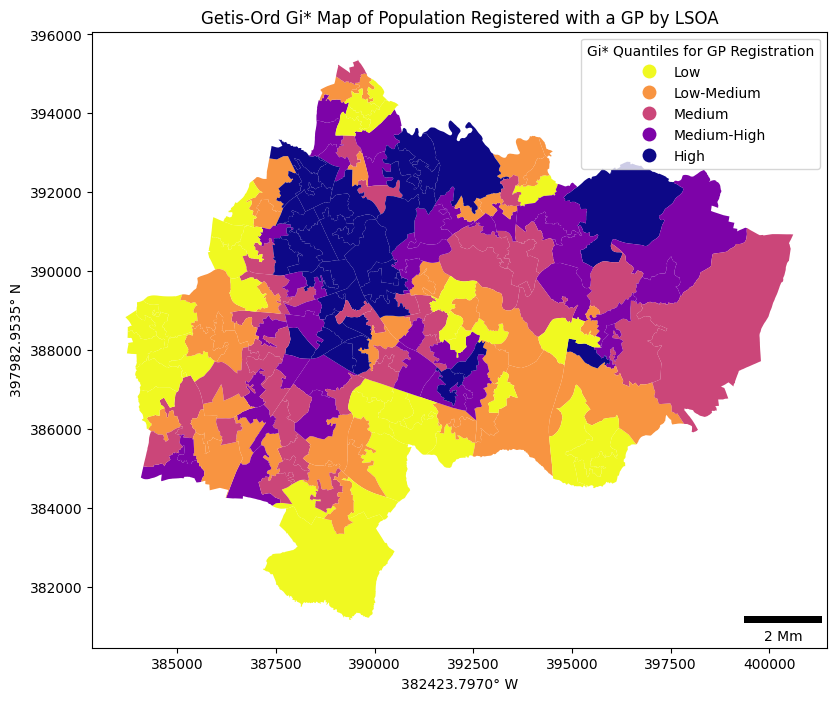

In [82]:
# Convert GeoDataFrame to PySAL format
w = libpysal.weights.Queen.from_dataframe(stockport_health, use_index=False)

# Convert 'gp_reg_pop' to float from integer
y = stockport_health['gp_reg_pop'].astype(float).values

# Calculate Getis-Ord Gi* statistic. It identifies spatial clusters of high or low values (ESRI).
lg = G_Local(y, w, star=0.5)

# Assign Getis-Ord Gi* values to the GeoDataFrame
stockport_health['local_gi'] = lg.Zs

# Classify the data into quantiles. Quantile assigns the same number of data values to each class (ESRI)
stockport_health['quantiles'] = pd.qcut(stockport_health['local_gi'], q=5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High'])

# Plot Getis-Ord Gi* values using quantiles
fig, ax = plt.subplots(figsize=(10, 8))
stockport_health.plot(column='quantiles', cmap='plasma_r', linewidth=0.001, ax=ax, edgecolor='white', legend=True, legend_kwds={'title': 'Gi* Quantiles for GP Registration'})
plt.title('Getis-Ord Gi* Map of Population Registered with a GP by LSOA')

# Set the longitude and latitude labels
lon_min, lon_max, lat_min, lat_max = stockport_health.total_bounds
lon_center = (lon_min + lon_max) / 2
lat_center = (lat_min + lat_max) / 2
plt.xlabel(f'{lon_center:.4f}° W')
plt.ylabel(f'{lat_center:.4f}° N')

# Add a scale bar
scale_bar = ScaleBar(dx=1, units='km', location='lower right')
ax.add_artist(scale_bar)

plt.show()

After analysing these series of maps, it is observed that areas with higher GP registration tend to have lower prevalence of certain health conditions like COPD, CHD, and smoking. Conversely, areas with lower GP registration show higher rates of these conditions. This could indicate that access to primary care services may influence population health outcomes.



---



In [83]:
# check the readme file for the abstract and detailed discussion and conclusion for the proejct.

***REFERENCES***

Ahmad, O. B., Pinto, C. B., Lopez, A. D., Murray, C. J. L., Lozano, R., Inoue, M. 2001. AGE STANDARDIZATION OF RATES: A NEW WHO STANDARD
https://www.researchgate.net/publication/203609941_Age_Standardization_of_Rates_A_New_WHO_Standard




Data classification methods
https://pro.arcgis.com/en/pro-app/latest/help/mapping/layer-properties/data-classification-methods.htm#:~:text=Quantile%20assigns%20the%20same%20number,map%20can%20often%20be%20misleading.

How Hot Spot Analysis (Getis-Ord Gi*) works
https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-statistics/h-how-hot-spot-analysis-getis-ord-gi-spatial-stati.htm




Pandey, R. and Dhoundiyalb, M. 2015. Quantitative Evaluation of Big Data Categorical Variables through R
https://www.sciencedirect.com/science/article/pii/S1877050915001611




Plotting masked and NaN values
https://matplotlib.org/stable/gallery/lines_bars_and_markers/masked_demo.html




Rafaat, Y. 2023. Leveraging Geospatial Data in Python with GeoPandas
https://www.kdnuggets.com/leveraging-geospatial-data-in-python-with-geopandas




Weichun, L. 2023 JavaScript Programming Naming Conventions: Basic Rules
https://techolist.org/naming-conventions/




---







In [84]:
# for the project requirement, count the number of words in countdown cells.

In [85]:
import nbformat

def count_words_in_markdown_cells(notebook_path):
    # Load the notebook
    with open(notebook_path, 'r', encoding='utf-8') as f:
        notebook = nbformat.read(f, as_version=4)

    markdown_word_count = 0

    # Iterate through the cells in the notebook
    for cell in notebook['cells']:
        if cell['cell_type'] == 'markdown':
            # Count words in markdown cells
            markdown_text = cell['source']
            markdown_word_count += len(markdown_text.split())

    return markdown_word_count

# Specify the path to your notebook
notebook_path = '/content/drive/MyDrive/Colab Notebooks/Project.ipynb'

# Get word count in markdown cells
markdown_word_count = count_words_in_markdown_cells(notebook_path)

print(f'Markdown cells word count: {markdown_word_count}')


Markdown cells word count: 679


In [86]:
# This does not include code cells and is being used just to get an idea of the number of words which should be <1500.

In [87]:
!jupyter nbconvert --to html '/content/drive/MyDrive/Colab Notebooks/Project.ipynb'


[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks/Project.ipynb to html
[NbConvertApp] Writing 4190119 bytes to /content/drive/MyDrive/Colab Notebooks/Project.html
